In [72]:
import matplotlib.pyplot as plt

SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 20

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=15)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=10)    # fontsize of the tick labels
plt.rc('ytick', labelsize=10)    # fontsize of the tick labels
plt.rc('legend', fontsize=15)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title


In [25]:
import numpy as np
from scipy import special
import matplotlib.pyplot as plt


tf= 1e-2 #Final time
dt= 5e-5 #Temporal resolution
r= 75e-3 # r constant 
L=1 # lenght size

n=0 # energy level
k0= 20 # constant of expoential phase
m = 1 # mass
omega = 50 #frequency

dx = np.sqrt(dt/(2*r)) # position precision

x = -np.arange(-L,L,dx) # position vector
xsize = len(x) 
t = np.arange(0,tf,dt) # time vector
tsize = len(t)

R = np.zeros( (xsize,tsize) ) #real part
I = np.zeros( (xsize,tsize) ) #complex part
Psi = np.zeros( (xsize,tsize), dtype='complex' )
V = np.zeros( xsize )
k1I = np.zeros( xsize ) # k1 of complex part
k1R = np.zeros( xsize ) # k1 of real part
k2I = np.zeros( xsize ) # k2 of complex part
k2R = np.zeros( xsize ) # k2 of real part
HR = np.zeros((xsize, tsize)) # real part of the hamiltonian operator
HI = np.zeros((xsize, tsize)) # complex part of the hamiltonian operator

V = (m/2)*((omega)**2)*x**2 # Harmonic potential

# V0 = omega**2
# a = 1
# V = V0*np.cosh(x/a) # hyperbolic potential

N = np.zeros(tsize) # normalization

def gauss(x,xc,sigma,k0):
    return (1/(( (2*np.pi)**(1/4) )*sigma**(1/2)))*(np.exp(( -(x-xc)**2 )/(4*(sigma**2))))

def init_uniform(x,x1,x2,X0, shape):
        x_pos = np.where((x >= x1) & (x <= x2))[0]
        Psi[x_pos, 0] = X0
        return Psi

def auto_estados(x,n,omega):
    hermite_pol = special.hermite(n, monic=False)
    return (1/np.sqrt(2**n*special.factorial(n)))*(omega/np.pi)**(1/4)*np.exp(-omega*x**2/2)*hermite_pol(np.sqrt(omega)*x)


In [26]:
def rk2_schrodinger(R,I,V,r,dt):
    
    for n in range(tsize -1):

        # ZERAR A BORDA
        I[0,:] = 0
        I[-1,:] = 0
        R[0,:] = 0
        R[-1,:] = 0
        
        # Condicao de contorno
        k1R[0] = -r*( I[1,n] - 2*I[0,n] + I[-1,n]) + V[0]*I[0,n]*dt
        k1I[0] = r*( R[1,n] - 2*R[0,n] + R[-1,n]) - V[0]*I[0,n]*dt
        k1R[-1] = -r*( I[0,n] - 2*I[-1,n] + I[-2,n]) + V[-1]*I[-1,n]*dt
        k1I[-1] = r*( R[0,n] - 2*R[-1,n] + R[-2,n]) - V[-1]*I[-1,n]*dt
        
        # O loop reduzido em array slicing
        k1R[1:-1] = -r*( I[2:,n] - 2*I[1:-1,n] + I[0:-2,n]) + V[1:-1]*I[1:-1,n]*dt
        k1I[1:-1] = r*( R[2:,n] - 2*R[1:-1,n] + R[0:-2,n]) - V[1:-1]*R[1:-1,n]*dt
        
        R12 = R[:,n] + k1R/2
        I12 = I[:,n] + k1I/2
        #print(I12[0])

        # Condicao de contorno
        k2R[0] = -r*( I12[1] - 2*I12[0] + I12[-1]) + V[0]*I12[0]*dt
        k2I[0] = r*( R12[1] - 2*R12[0] + R12[-1]) - V[0]*R12[0]*dt           
        k2R[-1] = -r*( I12[0] - 2*I12[-1] + I12[-2]) + V[-1]*I12[-1]*dt
        k2I[-1] = r*( R12[0] - 2*R12[-1] + R12[-2]) - V[-1]*R12[-1]*dt
        
        # O loop reduzido em array slicing
        k2R[1:-1] = -r*( I12[2:] - 2*I12[1:-1] + I12[0:-2]) + V[1:-1]*I12[1:-1]*dt
        k2I[1:-1] = r*(R12[2:] - 2*R12[1:-1] + R12[0:-2]) - V[1:-1]*R12[1:-1]*dt

        R[:, n+1] = R[:,n] + k2R
        I[:, n+1] = I[:,n] + k2I
        
        # ZERAR A BORDA
        I[0,:] = 0
        I[-1,:] = 0
        R[0,:] = 0
        R[-1,:] = 0
        
        HR[0,n] = -(1/2)*((R[1, n] - 2*R[0, n] + R[-2, n])/(dx**2)) + V[0]*R[0,n]
        HI[0,n] = -(1/2)*((I[1, n] - 2*I[0, n] + I[-2, n])/(dx**2)) + V[0]*I[0,n]

        HR[-1,n] = -(1/2)*((R[0, n] - 2*R[-1, n] + R[-2, n])/(dx**2)) + V[-1]*R[-1,n]
        HI[-1,n] = -(1/2)*((I[0, n] - 2*I[-1, n] + I[-2, n])/(dx**2)) + V[-1]*I[-1,n]

        HR[1:-1,n] = -(1/2)*((R[2:, n] - 2*R[1:-1, n] + R[0:-2, n])/(dx**2)) + V[1:-1]*R[1:-1,n]
        HI[1:-1,n] = -(1/2)*((I[2:, n] - 2*I[1:-1, n] + I[0:-2, n])/(dx**2)) + V[1:-1]*I[1:-1,n]
        
    HR[0,-1] = -(1/2)*((R[1, n] - 2*R[0, -1] + R[-2, -1])/(dx**2)) + V[0]*R[0,-1]
    HI[0,-1] = -(1/2)*((I[1, n] - 2*I[0, -1] + I[-2, -1])/(dx**2)) + V[0]*I[0,-1]

    HR[-1,-1] = -(1/2)*((R[0, n] - 2*R[-1, -1] + R[-2, -1])/(dx**2)) + V[-1]*R[-1,-1]
    HI[-1,-1] = -(1/2)*((I[0, n] - 2*I[-1, -1] + I[-2, -1])/(dx**2)) + V[-1]*I[-1,-1]

    HR[1:-1,-1] = -(1/2)*((R[2:, -1] - 2*R[1:-1, -1] + R[0:-2, -1])/(dx**2)) + V[1:-1]*R[1:-1,-1]
    HI[1:-1,-1] = -(1/2)*((I[2:, -1] - 2*I[1:-1, -1] + I[0:-2, -1])/(dx**2)) + V[1:-1]*I[1:-1,-1]

        
    return (R + 1j*I, HR + 1j*HI)

# Autoestados

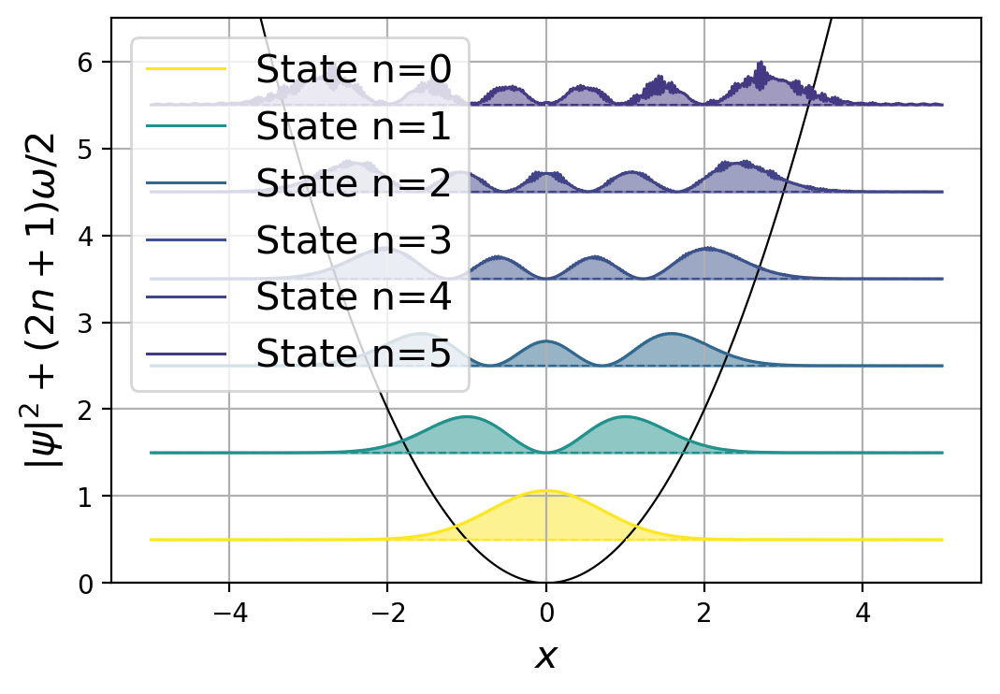

In [70]:
V = (m/2)*((omega)**2)*x**2 

E_array = np.zeros(6)
uncertain = np.zeros(6)

plt.figure(dpi=200)
cmap = plt.cm.viridis # replace with your favourite colormap 
plt.plot(x,V, color='black',linewidth=0.8)

for n in [0,1,2,3,4,5]:
    
    Psi[:,0] = auto_estados(x,n,omega)
    R[:,0] = Psi[:,0].real
    I[:,0] = Psi[:,0].imag
    Psi,H = rk2_schrodinger(R,I,V,r,dt)
    
    N = np.trapz( np.abs(Psi[:,:])**2, dx=dx, axis=0)
    E = np.trapz( np.conjugate(Psi[:,:])*H, dx=dx, axis=0)/N
    E_array[n] = np.mean(np.real(E))
    X = np.trapz(np.array([np.conjugate(Psi[:,t])*x*Psi[:,t] for t in range(Psi.shape[1])]), dx=dx,axis=1)
    X2 = np.trapz(np.array([np.conjugate(Psi[:,t])*(x**2)*Psi[:,t] for t in range(Psi.shape[1])]), dx=dx,axis=1)
    P = np.trapz(np.array([np.conjugate(Psi[:,t])*(-1j*np.gradient(Psi[:,t],dx)) for t in range(Psi.shape[1])]), dx=dx,axis=1)
    P2 = -np.trapz(np.array([np.conjugate(Psi[:,t])*(np.gradient(np.gradient(Psi[:,t],dx),dx)) for t in range(Psi.shape[1])]), dx=dx,axis=1)
    uncertain[n] = np.sqrt(np.mean(np.real(P2)) - np.mean(np.real(P)**2))*np.sqrt(np.mean(np.real(X2)) - np.mean(np.real(X)**2))
    
    plt.plot(x,np.abs(Psi[:,-1])**2 + (2*n + 1)*omega/2,label='State n={}'.format(n),color=cmap(1/(n+1)), linewidth=1.1) 
    plt.plot(x,np.real(E[:x.size]),'--', color=cmap(1/(n+1)), linewidth=.8 )
    plt.fill_between(x, np.abs(Psi[:,-1])**2 + (2*n + 1)*omega/2 ,np.real(E[:x.size]), color=cmap(1/(n+1)), alpha=.5)
    
plt.ylabel(r'$|\psi|^2 + (2n + 1)\omega/2$')
plt.xlabel(r'$x$')
plt.ylim(0,np.max(np.abs(Psi[:,-1])**2 + (2*n + 1)*omega/2) + 1/2)
plt.grid()
plt.legend()
#plt.ylim(0,100)
#plt.savefig("eigensates.png")
plt.show()

In [71]:
V = (m/2)*((omega)**2)*x**2 
Psi[:,0] = auto_estados(x,25,omega)
R[:,0] = Psi[:,0].real
I[:,0] = Psi[:,0].imag
Psi,H = rk2_schrodinger(R,I,V,r,dt)
N = np.trapz( np.abs(Psi[:,:])**2, dx=dx, axis=0)
E = np.trapz( np.conjugate(Psi[:,:])*H, dx=dx, axis=0)/N

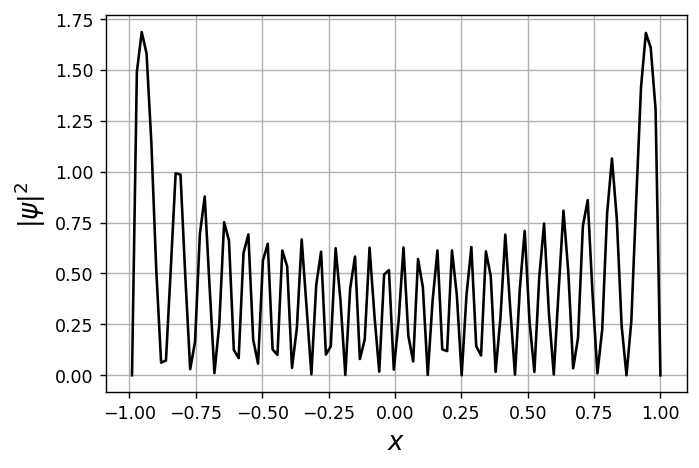

In [39]:
import matplotlib.pyplot as plt
plt.figure(dpi=125)
plt.plot(x,np.abs(Psi[:,0])**2, color='black')
plt.ylabel(r'$|\psi|^2$')
plt.xlabel(r'$x$')
plt.grid()
plt.savefig("quantum_oscilator.png")
plt.show()

In [33]:
np.mean(np.real(E))

24.973994464675616

## Valor esperado da posição

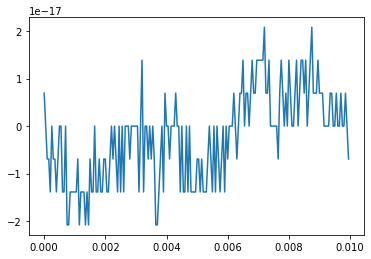

In [495]:
X = np.trapz(np.array([np.conjugate(Psi[:,t])*x*Psi[:,t] for t in range(Psi.shape[1])]), dx=dx,axis=1)
plt.plot(t,X)

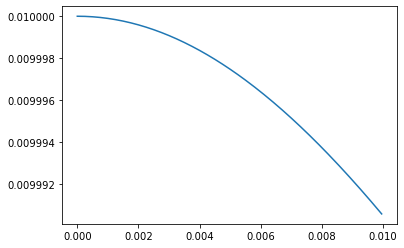

In [496]:
X2 = np.trapz(np.array([np.conjugate(Psi[:,t])*(x**2)*Psi[:,t] for t in range(Psi.shape[1])]), dx=dx,axis=1)
plt.plot(t,X2)
#plt.yscale()

## Valor esperado da energia

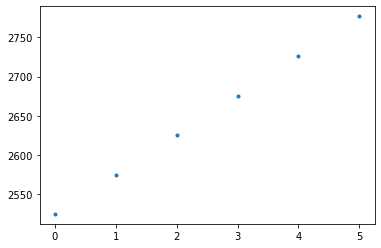

In [510]:
plt.plot(E_array, '.')

(0.0, 30.0)

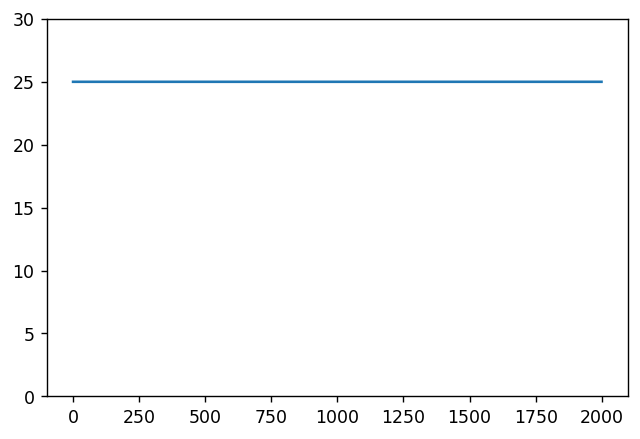

In [454]:
plt.figure(dpi=125)
plt.plot(np.real(E))
plt.ylim(0,30)

# Valor esperado do momento

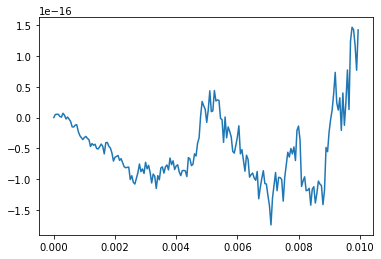

In [286]:
P = np.trapz(np.array([np.conjugate(Psi[:,t])*(-1j*np.gradient(Psi[:,t],dx)) for t in range(Psi.shape[1])]), dx=dx,axis=1)
plt.plot(t,P)

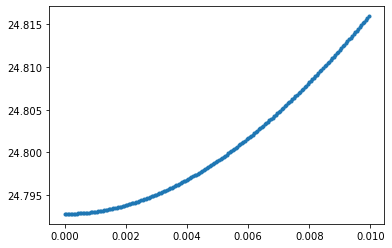

In [308]:
#P2 = np.trapz(np.array([np.conjugate(Psi[:-2,t])*(np.diff(Psi[:,t],2)) for t in range(Psi.shape[1])]), dx=dx,axis=1)
P2 = -np.trapz(np.array([np.conjugate(Psi[:,t])*(np.gradient(np.gradient(Psi[:,t],dx),dx)) for t in range(Psi.shape[1])]), dx=dx,axis=1)
plt.plot(t,P2,'.')

# Relação de incerteza

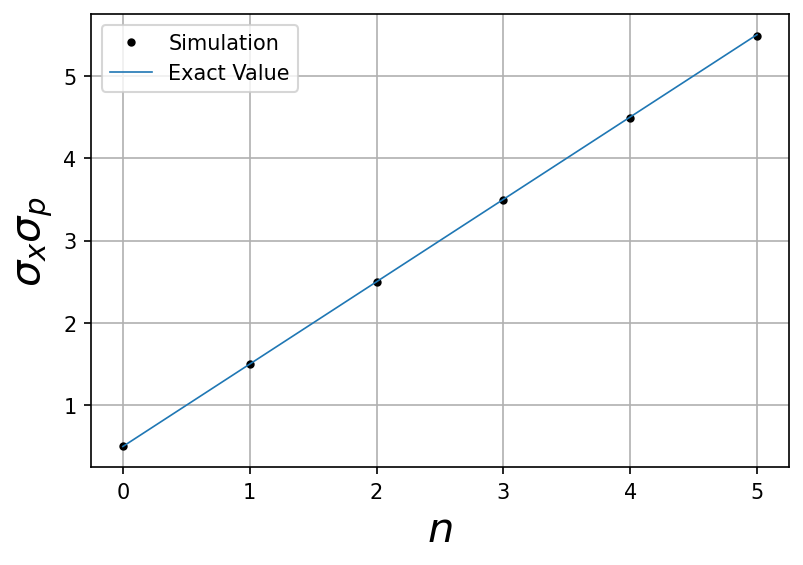

In [548]:
plt.figure(dpi=150)
plt.plot(uncertain, '.',color='black', label='Simulation')
plt.plot([0.5, 1.5,2.5,3.5,4.5,5.5], linewidth=0.8, label='Exact Value')
plt.ylabel(r'$\sigma_x \sigma_p$')
plt.xlabel(r'$n$')
plt.grid()
plt.legend()
plt.savefig('uncertainty.png')

# Normalização

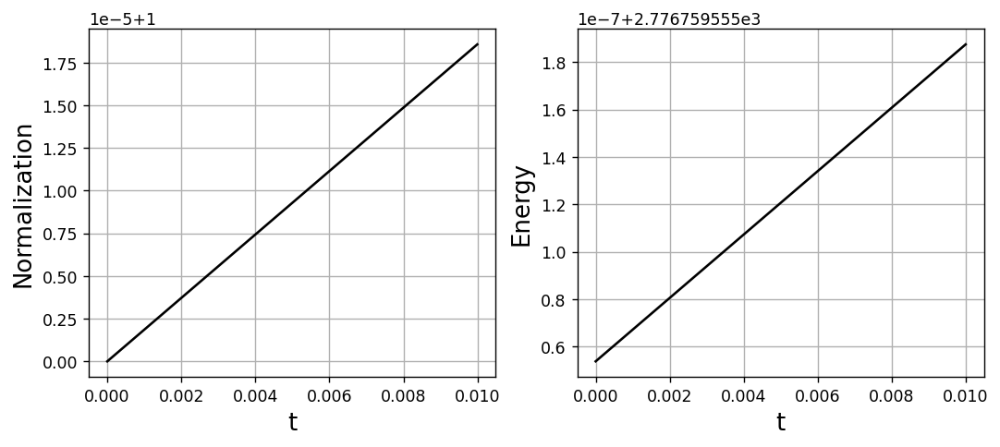

In [605]:
fig,axs = plt.subplots(1,2,dpi=125, figsize=(10,4))

axs[0].plot(t,N, color='black')
axs[0].set_ylabel('Normalization')
axs[0].set_xlabel('t')
#axs[0].set_ylim(0.9999, 1.0001)
#plt.yscale('log')
axs[0].grid()

axs[1].plot(t,E, color='black')
axs[1].set_ylabel('Energy')
axs[1].set_xlabel('t')
#axs[0].set_ylim(0.9999, 1.0001)
#plt.yscale('log')
axs[1].grid()

plt.savefig('Norm_energy.png')
plt.show()

In [606]:
N

array([1.        , 1.00000001, 1.00000002, ..., 1.00001855, 1.00001856,
       1.00001857])

# Autoestados * exp(-ikx)

In [102]:
def init_cond(x,n,omega,k):
    hermite_pol = special.hermite(n, monic=False)
    return (1/np.sqrt(2**n*special.factorial(n)))*(omega/np.pi)**(1/4)*np.exp(-omega*x**2/2)*hermite_pol(np.sqrt(omega)*x)*np.exp(-1j*k*x)

In [129]:

tf= 5e-1
dt= 5e-5 
r= 75e-3 
L=1

n=0
xc=0
sigma=0.2
k0= 20
m = 1
omega = 50
dx = np.sqrt(dt/(2*r))
x = -np.arange(-L,L,dx)
xsize = len(x) 
t = np.arange(0,tf,dt)
tsize = len(t)


R = np.zeros( (xsize,tsize) ) #Parte real
I = np.zeros( (xsize,tsize) ) #Parte complexa
Psi = np.zeros( (xsize,tsize), dtype='complex' )
V = np.zeros( xsize )
k1I = np.zeros( xsize ) # k1 da parte imaginaria
k1R = np.zeros( xsize ) # k1 da parte real
k2I = np.zeros( xsize ) # k2 da parte imaginaria
k2R = np.zeros( xsize ) # k2 da parte real
HR = np.zeros((xsize, tsize)) # Array do operador em real
HI = np.zeros((xsize, tsize)) # Array do operador em imaginario


# meio = np.zeros( (2,xsize) ) # meios passos
N = np.zeros(tsize) # Integral mostrando a normalizacao


In [130]:
V = (m/2)*((omega)**2)*x**2 

k = 10
omega = 50

Psi[:,0] = init_cond(x,0,omega,k)
R[:,0] = Psi[:,0].real
I[:,0] = Psi[:,0].imag
Psi,H = rk2_schrodinger(R,I,V,r,dt)
N = np.trapz( np.abs(Psi[:,:])**2, dx=dx, axis=0)
E = np.trapz( np.conjugate(Psi[:,:])*H, dx=dx, axis=0)/N

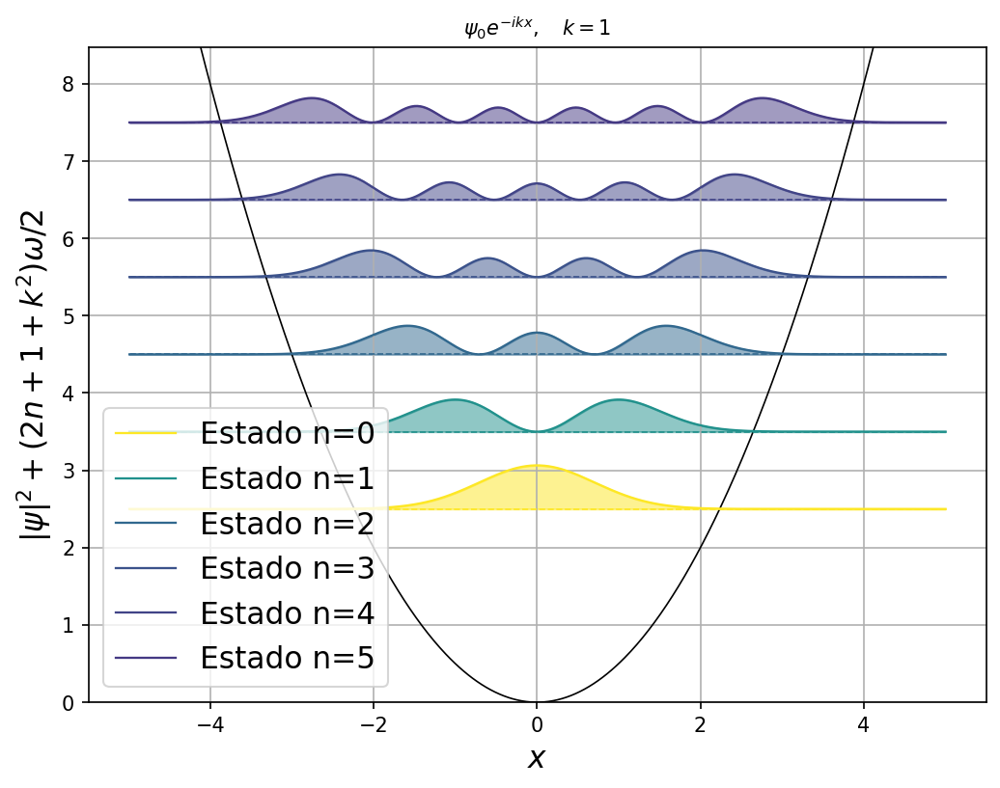

In [105]:
plt.figure(figsize=(8,6),dpi=150)

cmap = plt.cm.viridis # replace with your favourite colormap 
plt.plot(x,V, color='black',linewidth=0.8)
for n in [0,1,2,3,4,5]:
    Psi[:,0] = init_cond(x,n,omega,k)
    R[:,0] = Psi[:,0].real
    I[:,0] = Psi[:,0].imag
    Psi,H = rk2_schrodinger(R,I,V,r,dt)
    N = np.trapz( np.abs(Psi[:,:])**2, dx=dx, axis=0)
    E = np.trapz( np.conjugate(Psi[:,:])*H, dx=dx, axis=0)/N
    plt.plot(x,np.abs(Psi[:,0])**2 + (2*n + 1 + k**2)*omega/2,label='Estado n={}'.format(n),color=cmap(1/(n+1)), linewidth=1.1) 
    plt.plot(x,np.real(E[:x.size]),'--', color=cmap(1/(n+1)), linewidth=.8 )
    plt.fill_between(x, np.abs(Psi[:,0])**2 + (2*n + 1 + k**2)*omega/2, np.real(E[:x.size]), color=cmap(1/(n+1)), alpha=.5)
    
plt.title(r'$\psi_0 e^{-ikx}, \quad k =1$')
plt.ylabel(r'$|\psi|^2 + (2n + 1 + k^2)\omega/2$')
plt.xlabel(r'$x$')
plt.ylim(0,np.max(np.abs(Psi[:,-1])**2 + (2*n + 1 + k**2)*omega/2) + 1/2)
plt.grid()
plt.legend()
#plt.savefig("complex_phase.png")
plt.show()

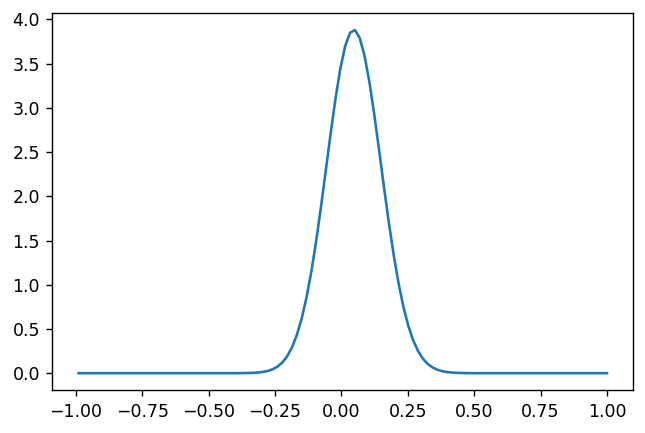

In [131]:
import matplotlib.pyplot as plt
plt.figure(dpi=125)
plt.plot(x,np.abs(Psi[:,-1])**2) 
#plt.plot(x,V)

## $$ \langle X \rangle $$

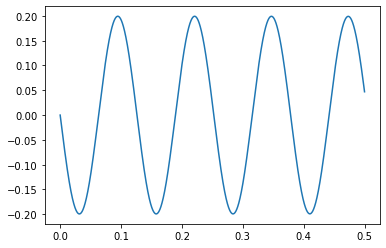

In [132]:
X = np.trapz(np.array([np.conjugate(Psi[:,t])*x*Psi[:,t] for t in range(Psi.shape[1])]), dx=dx,axis=1)
plt.plot(t,X)

## $$ \langle p \rangle $$

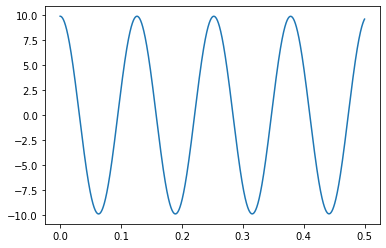

In [133]:
P = np.trapz(np.array([np.conjugate(Psi[:,t])*(-1j*np.gradient(Psi[:,t],dx)) for  t in range(Psi.shape[1])]), dx=dx,axis=1)
plt.plot(t,P)


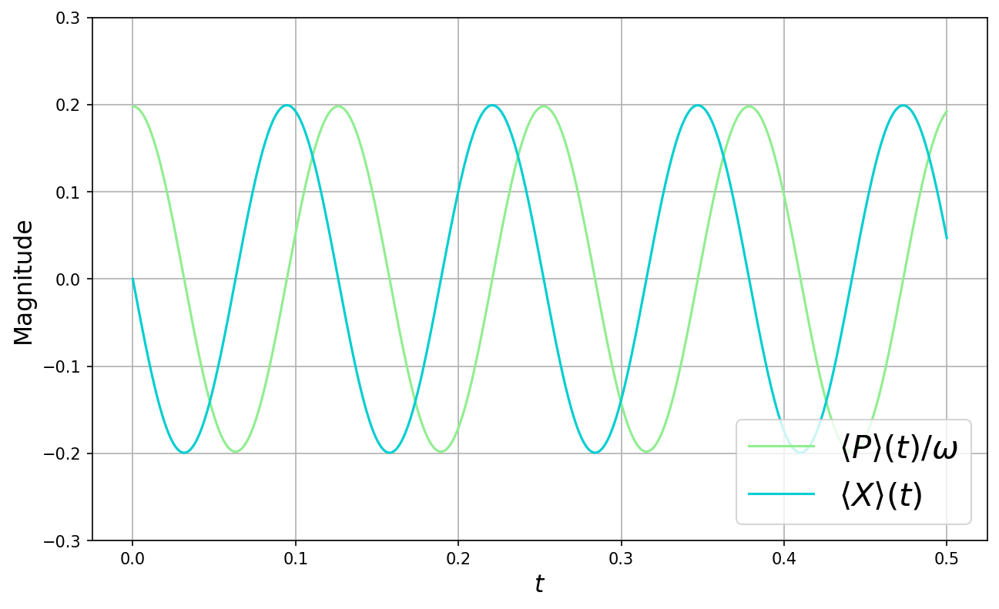

In [20]:
plt.figure(figsize=(10,6),dpi=150)
plt.plot(t,P/omega, color='lightgreen', label=r'$\langle P \rangle(t)/\omega$')
plt.plot(t,X, color='darkturquoise', label=r'$\langle X \rangle(t)$')
plt.legend(prop={'size' : 20})
plt.ylim(-.3,.3)
plt.xlabel(r"$t$")
plt.ylabel("Magnitude")
plt.grid()
plt.savefig("pos_momentum.png")
plt.show()

/var/folders/24/hz8c6rbx3r32smymhrvkwbmc0000gn/T/ipykernel_4546/3005187653.py:31: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.tight_layout()
/opt/homebrew/Caskroom/miniforge/base/envs/core/lib/python3.9/site-packages/matplotlib/animation.py:887: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you have outputted the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(
/var/folders/24/hz8c6rbx3r32smymhrvkwbmc0000gn/T/ipykernel_4546/3005187653.py:31: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.tight_layout()


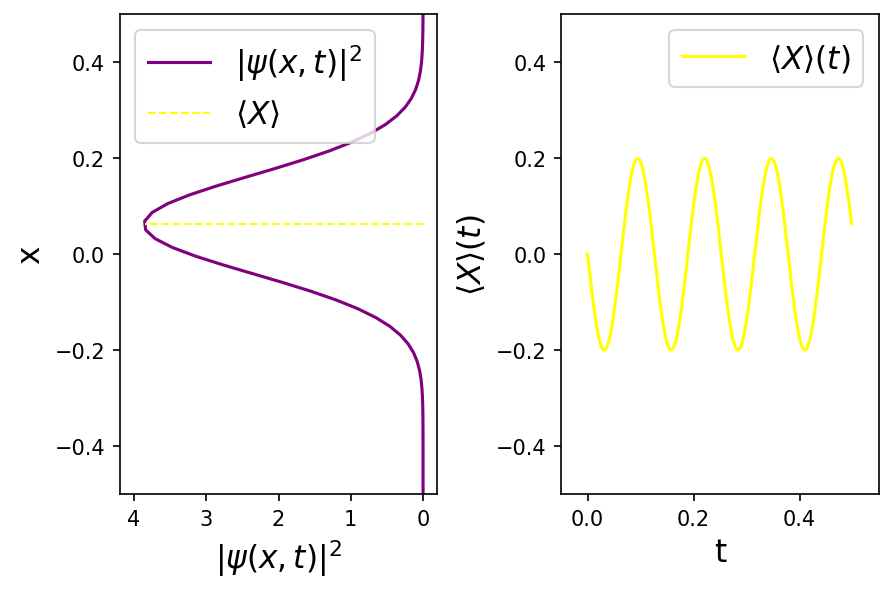

In [148]:
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.animation import FuncAnimation
from matplotlib.animation import FFMpegWriter

rcParams['animation.embed_limit'] = 2**128
fig, ax = plt.subplots(nrows=1, ncols=2, dpi=150)
pico = np.max(np.abs(Psi[:, 0])**2)
step = int(tsize/300)
time = np.arange(0, tf, dt)

def animate(i):
    ax[0].clear()
    ax[1].clear()
    ax[0].plot(np.abs(Psi[:, step*i])**2, x, label=r'$| \psi (x, t) |^2$', color='purple')
    ax[0].hlines(y=np.real(X[step*i]), xmin=0, xmax=np.max(np.abs(Psi[:, step*i])**2), color='yellow', 
              ls='--', lw=1, label=r'$\langle X \rangle$')
    ax[0].set_ylabel('x')
    ax[0].set_xlabel(r'$| \psi (x, t) |^2$')
    ax[0].set_ylim(-0.5, 0.5)
    ax[0].set_xlim(-0.2, 4.2)
    ax[0].invert_xaxis()
    
    ax[1].plot(t[:step*i], np.real(X[:step*i]), color='yellow', label=r'$\langle X \rangle (t)$')
    ax[1].set_ylim(-0.5, 0.5)
    ax[1].set_xlim(-0.05, 0.55)
    ax[1].set_xlabel('t')
    ax[1].set_ylabel(r'$\langle X \rangle (t)$')
    ax[0].legend(loc=2)
    ax[1].legend()
    fig.tight_layout()
    
ani = FuncAnimation(fig, animate, frames=int(tsize/step), interval=33, repeat=False)

f = r'xmean_oscillation.mp4' 
writervideo = FFMpegWriter(fps=30) 
ani.save(f, writer=writervideo, dpi=500)

from IPython.display import HTML
HTML(ani.to_jshtml())

# Cosh Potential

In [498]:
tf= 1e-2
dt= 5e-6 
r= 75e-3 
L=1

n=0

xc=0
sigma=0.2
k0= 20
m = 1
omega = 50

dx = np.sqrt(dt/(2*r))

x = -np.arange(-L,L,dx)
xsize = len(x) 
t = np.arange(0,tf,dt)
tsize = len(t)
R = np.zeros( (xsize,tsize) ) #Parte real
I = np.zeros( (xsize,tsize) ) #Parte complexa
Psi = np.zeros( (xsize,tsize), dtype='complex' )
V = np.zeros( xsize )
k1I = np.zeros( xsize ) # k1 da parte imaginaria
k1R = np.zeros( xsize ) # k1 da parte real
k2I = np.zeros( xsize ) # k2 da parte imaginaria
k2R = np.zeros( xsize ) # k2 da parte real
HR = np.zeros((xsize, tsize)) # Array do operador em real
HI = np.zeros((xsize, tsize)) # Array do operador em imaginario

V0 = omega**2
a = 1
V = V0*np.cosh(x/a)

In [499]:
Psi[:,0] = auto_estados(x,0,omega)
R[:,0] = Psi[:,0].real
I[:,0] = Psi[:,0].imag
Psi,H = rk2_schrodinger(R,I,V,r,dt)
N = np.trapz( np.abs(Psi[:,:])**2, dx=dx, axis=0)
E = np.trapz( np.conjugate(Psi[:,:])*H, dx=dx, axis=0)/N

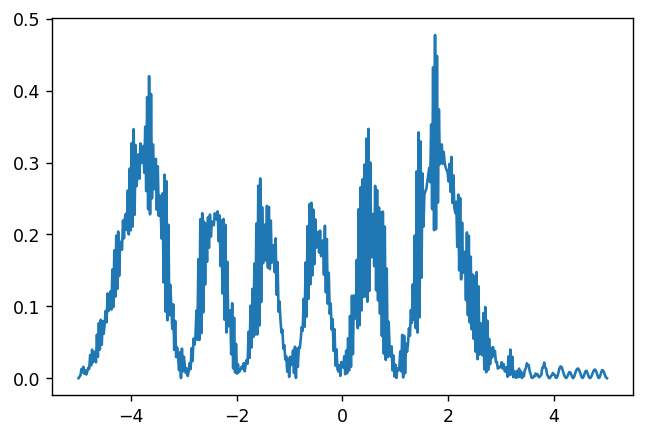

In [101]:
import matplotlib.pyplot as plt
plt.figure(dpi=125)
plt.plot(x,np.abs(Psi[:,-1])**2) 

In [504]:
np.mean(np.real(E))

2525.0286983436113